### Filter design

In this simulation, the robot has a state vector includes 4 states at time $t$.

$$\textbf{x}_t=[x_t, y_t, \phi_t, v_t]$$

x, y are a 2D x-y position, $\phi$ is orientation, and v is velocity.

In the code, "xEst" means the state vector.

And, $P_t$ is covariace matrix of the state,

$Q$ is covariance matrix of process noise, 

$R$ is covariance matrix of observation noise at time $t$ 

　

The robot has a speed sensor and a gyro sensor.

So, the input vecor can be used as each time step

$$\textbf{u}_t=[v_t, \omega_t]$$

Also, the robot has a GNSS sensor, it means that the robot can observe x-y position at each time.

$$\textbf{z}_t=[x_t,y_t]$$

The input and observation vector includes sensor noise.


In [11]:
import math
import numpy as np
import matplotlib.pyplot as plt

### Simulator config

In this simulation configuration part, it contains

$Q$ is covariance matrix of process noise, 

$R$ is covariance matrix of observation noise at time $t$ 

The input and observation vector includes sensor noise.

In the code, "observation" function generates the input and observation vector with noise

In [12]:
#### Covariance for EKF simulation ####

# predict state covariance
Q = np.diag([
    0.1, # variance of location on x-axis
    0.1, # variance of location on y-axis
    np.deg2rad(1.0), # variance of yaw angle
    1.0 # variance of velocity
    ])**2

# Observation x,y position covariance
R = np.diag([1.0, 1.0])**2  

#  Simulation parameter
INPUT_NOISE = np.diag([1.0, np.deg2rad(30.0)])**2
GPS_NOISE = np.diag([0.5, 0.5])**2

DT = 0.1  # time tick [s]
SIM_TIME = 50.0  # simulation time [s]

show_animation = True

In [13]:
def calc_input():
    v = 1.0  # [m/s]
    yawrate = 0.1  # [rad/s]
    u = np.array([[v], [yawrate]])
    return u


def observation(xTrue, xd, u):

    xTrue = motion_model(xTrue, u)

    # add noise to gps x-y
    z = observation_model(xTrue) + GPS_NOISE @ np.random.randn(2, 1)

    # add noise to input
    ud = u + INPUT_NOISE @ np.random.randn(2, 1)

    xd = motion_model(xd, ud)

    return xTrue, z, xd, ud


def plot_covariance_ellipse(xEst, PEst):  # pragma: no cover
    Pxy = PEst[0:2, 0:2]
    eigval, eigvec = np.linalg.eig(Pxy)

    if eigval[0] >= eigval[1]:
        bigind = 0
        smallind = 1
    else:
        bigind = 1
        smallind = 0

    t = np.arange(0, 2 * math.pi + 0.1, 0.1)
    a = math.sqrt(eigval[bigind])
    b = math.sqrt(eigval[smallind])
    x = [a * math.cos(it) for it in t]
    y = [b * math.sin(it) for it in t]
    angle = math.atan2(eigvec[bigind, 1], eigvec[bigind, 0])
    R = np.array([[math.cos(angle), math.sin(angle)],
                  [-math.sin(angle), math.cos(angle)]])
    fx = R@(np.array([x, y]))
    px = np.array(fx[0, :] + xEst[0, 0]).flatten()
    py = np.array(fx[1, :] + xEst[1, 0]).flatten()
    plt.plot(px, py, "--r")

### Motion Model

The robot model is 

$$ \dot{x} = vcos(\phi)$$

$$ \dot{y} = vsin((\phi)$$

$$ \dot{\phi} = \omega$$


So, the motion model is

$$\textbf{x}_{t+1} = F\textbf{x}_t+B\textbf{u}_t$$

where

$\begin{equation*}
F=
\begin{bmatrix}
1 & 0 & 0 & 0\\
0 & 1 & 0 & 0\\
0 & 0 & 1 & 0 \\
0 & 0 & 0 & 0 \\
\end{bmatrix}
\end{equation*}$

$\begin{equation*}
B=
\begin{bmatrix}
cos(\phi)dt & 0\\
sin(\phi)dt & 0\\
0 & dt\\
1 & 0\\
\end{bmatrix}
\end{equation*}$

$dt$ is a time interval.

Its Jacobian matrix is

$\begin{equation*}
J_F=
\begin{bmatrix}
\frac{dx}{dx}& \frac{dx}{dy} & \frac{dx}{d\phi} &  \frac{dx}{dv}\\
\frac{dy}{dx}& \frac{dy}{dy} & \frac{dy}{d\phi} &  \frac{dy}{dv}\\
\frac{d\phi}{dx}& \frac{d\phi}{dy} & \frac{d\phi}{d\phi} &  \frac{d\phi}{dv}\\
\frac{dv}{dx}& \frac{dv}{dy} & \frac{dv}{d\phi} &  \frac{dv}{dv}\\
\end{bmatrix}
\end{equation*}$

$\begin{equation*}
　=
\begin{bmatrix}
1& 0 & -v sin(\phi)dt &  cos(\phi)dt\\
0 & 1 & v cos(\phi)dt & sin(\phi) dt\\
0 & 0 & 1 & 0\\
0 & 0 & 0 & 1\\
\end{bmatrix}
\end{equation*}$

In [14]:
def motion_model(x, u):

    F = np.array([[1.0, 0, 0, 0],
                  [0, 1.0, 0, 0],
                  [0, 0, 1.0, 0],
                  [0, 0, 0, 0]])

    B = np.array([[DT * math.cos(x[2, 0]), 0],
                  [DT * math.sin(x[2, 0]), 0],
                  [0.0, DT],
                  [1.0, 0.0]])

    x = F @ x + B @ u

    return x

def jacobF(x, u):
    """
    Jacobian of Motion Model

    motion model
    x_{t+1} = x_t+v*dt*cos(yaw)
    y_{t+1} = y_t+v*dt*sin(yaw)
    yaw_{t+1} = yaw_t+omega*dt
    v_{t+1} = v{t}
    so
    dx/dyaw = -v*dt*sin(yaw)
    dx/dv = dt*cos(yaw)
    dy/dyaw = v*dt*cos(yaw)
    dy/dv = dt*sin(yaw)
    """
    yaw = x[2, 0]
    v = u[0, 0]
    jF = np.array([
        [1.0, 0.0, -DT * v * math.sin(yaw), DT * math.cos(yaw)],
        [0.0, 1.0, DT * v * math.cos(yaw), DT * math.sin(yaw)],
        [0.0, 0.0, 1.0, 0.0],
        [0.0, 0.0, 0.0, 1.0]])

    return jF

### Observation Model

The robot can get x-y position infomation from GPS.

So GPS Observation model is

$$\textbf{z}_{t} = H\textbf{x}_t$$

where

$\begin{equation*}
B=
\begin{bmatrix}
1 & 0 & 0& 0\\
0 & 1 & 0& 0\\
\end{bmatrix}
\end{equation*}$

Its Jacobian matrix is

$\begin{equation*}
J_H=
\begin{bmatrix}
\frac{dx}{dx}& \frac{dx}{dy} & \frac{dx}{d\phi} &  \frac{dx}{dv}\\
\frac{dy}{dx}& \frac{dy}{dy} & \frac{dy}{d\phi} &  \frac{dy}{dv}\\
\end{bmatrix}
\end{equation*}$

$\begin{equation*}
　=
\begin{bmatrix}
1& 0 & 0 & 0\\
0 & 1 & 0 & 0\\
\end{bmatrix}
\end{equation*}$


In [15]:
def observation_model(x):
    H = np.array([
        [1, 0, 0, 0],
        [0, 1, 0, 0]
    ])

    z = H @ x

    return z

def jacobH(x):
    # Jacobian of Observation Model
    jH = np.array([
        [1, 0, 0, 0],
        [0, 1, 0, 0]
    ])

    return jH

### Extented Kalman Filter

Localization process using Extendted Kalman Filter:EKF is

=== Predict ===

$x_{Pred} = Fx_t+Bu_t$

$P_{Pred} = J_FP_t J_F^T + Q$

=== Update ===

$z_{Pred} = Hx_{Pred}$ 

$y = z - z_{Pred}$

$S = J_H P_{Pred}.J_H^T + R$

$K = P_{Pred}.J_H^T S^{-1}$

$x_{t+1} = x_{Pred} + Ky$

$P_{t+1} = ( I - K J_H) P_{Pred}$


In [16]:
def ekf_estimation(xEst, PEst, z, u):

    #  Predict
    xPred = motion_model(xEst, u)
    jF = jacobF(xPred, u)
    PPred = jF@PEst@jF.T + Q

    #  Update
    jH = jacobH(xPred)
    zPred = observation_model(xPred)
    y = z - zPred
    S = jH@PPred@jH.T + R
    K = PPred@jH.T@np.linalg.inv(S)
    xEst = xPred + K@y
    PEst = (np.eye(len(xEst)) - K@jH)@PPred

    return xEst, PEst

 start!!


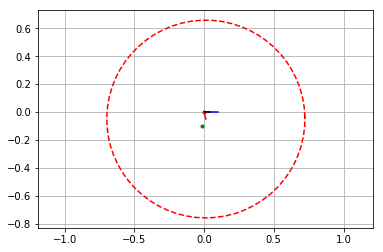

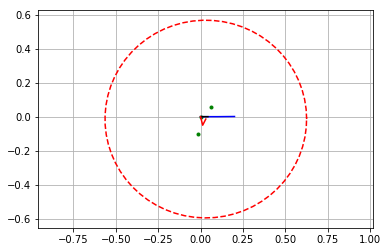

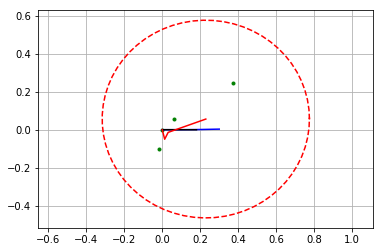

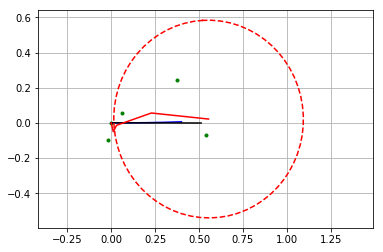

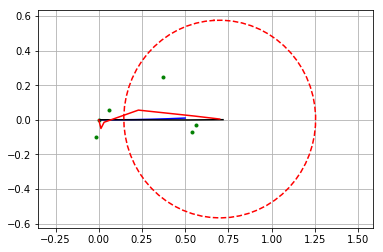

...

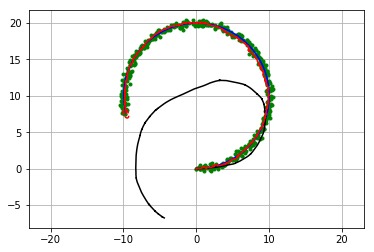

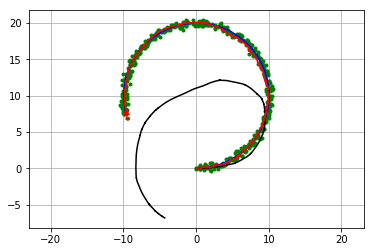

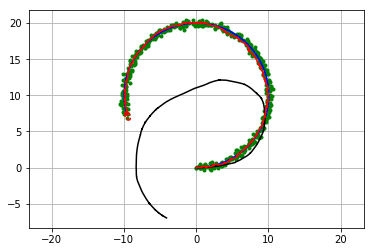

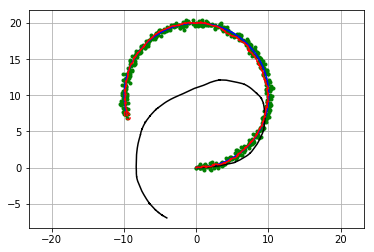

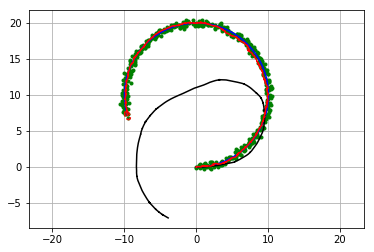

In [17]:
print(" start!!")

time = 0.0

# State Vector [x y yaw v]'
xEst = np.zeros((4, 1))
xTrue = np.zeros((4, 1))
PEst = np.eye(4)

xDR = np.zeros((4, 1))  # Dead reckoning

# history
hxEst = xEst
hxTrue = xTrue
hxDR = xTrue
hz = np.zeros((2, 1))

while SIM_TIME >= time:
    time += DT
    u = calc_input()

    xTrue, z, xDR, ud = observation(xTrue, xDR, u)

    xEst, PEst = ekf_estimation(xEst, PEst, z, ud)

    # store data history
    hxEst = np.hstack((hxEst, xEst))
    hxDR = np.hstack((hxDR, xDR))
    hxTrue = np.hstack((hxTrue, xTrue))
    hz = np.hstack((hz, z))

    if show_animation:
        plt.cla()
        plt.plot(hz[0, :], hz[1, :], ".g")
        plt.plot(hxTrue[0, :].flatten(),
                 hxTrue[1, :].flatten(), "-b")
        plt.plot(hxDR[0, :].flatten(),
                 hxDR[1, :].flatten(), "-k")
        plt.plot(hxEst[0, :].flatten(),
                 hxEst[1, :].flatten(), "-r")
        plot_covariance_ellipse(xEst, PEst)
        plt.axis("equal")
        plt.grid(True)
        plt.pause(0.001)